# Занятие 4.
# Введение в Retrieval-Augmented Generation (RAG)

### RECAP.
1. Что такое LLM и какие задачи умеет решать LLM?
2. Какие проблемы есть при использовании LLM?
3. Как "обновлять знания" LLM?


## RAG

RAG (Retrieval-Augmented Generation) is an AI technique that combines the strengths of traditional information retrieval systems (such as databases) with the capabilities of generative large language models (LLMs).  
By combining this extra knowledge with its own language skills, the AI can write text that is more accurate, up-to-date, and relevant to your specific needs.

### How does Retrieval-Augmented Generation work?


RAGs operate with a few main steps to help enhance generative AI outputs:


__Retrieval:__  
RAGs use powerful search algorithms to query external data, such as web pages, knowledge bases, and databases.

__Generation:__  
The received and pre-processed information can be easily embedded in the LLM. This integration enhances the LLM's context, providing it with a more comprehensive understanding of the topic. This augmented context enables the LLM to generate more precise, informative, and engaging responses.



RAG operates by first retrieving relevant information from a database using a query.
This retrieved information is then integrated into the LLM's query input, enabling it to generate more accurate and contextually relevant text.  
RAG use vector databases, which store data in a way that facilitates efficient search and retrieval.

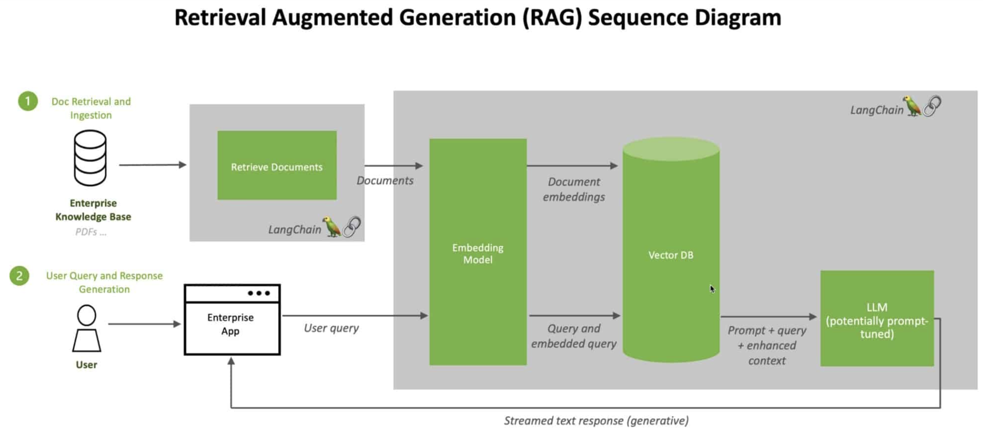

### Why Use RAG?

RAG offers several advantages over traditional methods of text generation, especially when dealing with factual information or data-driven responses.  

### Access to updated information

Traditional LLMs are often limited to their pre-trained knowledge and data.  
This could lead to potentially outdated or inaccurate responses. RAG overcomes this by granting LLMs access to external information sources, ensuring accurate and up-to-date answers.

### Factual grounding

LLMs are powerful tools for generating creative and engaging text, but they can sometimes struggle with factual accuracy. This is because LLMs are trained on massive amounts of text data, which may contain inaccuracies or biases.

RAG helps address this issue by providing LLMs with access to a curated knowledge base, ensuring that the generated text is grounded in factual information. This makes RAG particularly valuable for applications where accuracy is paramount, such as news reporting, scientific writing, or customer service.

Note: RAG may also assist in preventing hallucinations being sent to the end user. The LLM will still generate solutions from time to time where its training is incomplete but the RAG technique helps improve the user experience.

### Contextual relevance

The retrieval mechanism in RAG ensures that the retrieved information is relevant to the input query or context.

By providing the LLM with contextually relevant information, RAG helps the model generate responses that are more coherent and aligned with the given context.

This contextual grounding helps to reduce the generation of irrelevant or off-topic responses.

### Factual consistency

RAG encourages the LLM to generate responses that are consistent with the retrieved factual information.

By conditioning the generation process on the retrieved knowledge, RAG helps to minimize contradictions and inconsistencies in the generated text.

This promotes factual consistency and reduces the likelihood of generating false or misleading information.

## Search for similar sentences and texts

Similarity is the distance between two vectors where the vector dimensions represent the features of two objects. In simple terms, similarity is the measure of how different or alike two data objects are.  
If the distance is small, the objects are said to have a high degree of similarity and vice versa. Generally, it is measured in the range 0 to 1.  
This score in the range of [0, 1] is called the similarity score.

For instance, the K-Nearest-Neighbors classifier uses similarity to classify new data objects; K-means clustering utilizes similarity measures to assign data points to appropriate clusters.  
Even recommendation engines use neighborhood-based collaborative filtering methods which use similarity to identify a user’s neighbors.

__Text Similarity__

Take a look at the following sentences:

The bottle is empty.  
There is nothing in the bottle.  


As humans, it is very obvious to us that the two sentences mean the same thing despite being written in completely different formats. But how do we make an algorithm come to that same conclusion?

The first part of this problem is representation. How do we represent the text?  
We could leave the text as it is or convert it into feature vectors using a suitable text embedding technique.  
Once we have the text representation, we can compute the similarity score using one of the many distance/similarity measures.

Let’s dive deeper into the two aspects of the problem, starting with the similarity measures.



## Similarity Measures


__Jaccard Index__  

Jaccard index, also known as Jaccard similarity coefficient, treats the data objects like sets.
It is defined as the size of the intersection of two sets divided by the size of the union. Let’s continue with our previous example:

Sentence 1: The bottle is empty.

Sentence 2: There is nothing in the bottle.

To calculate the similarity using Jaccard similarity, we will first perform text normalization to reduce words their roots/lemmas. There are no words to reduce in the case of our example sentences, so we can move on to the next part. Drawing a Venn diagram of the sentences we  get:

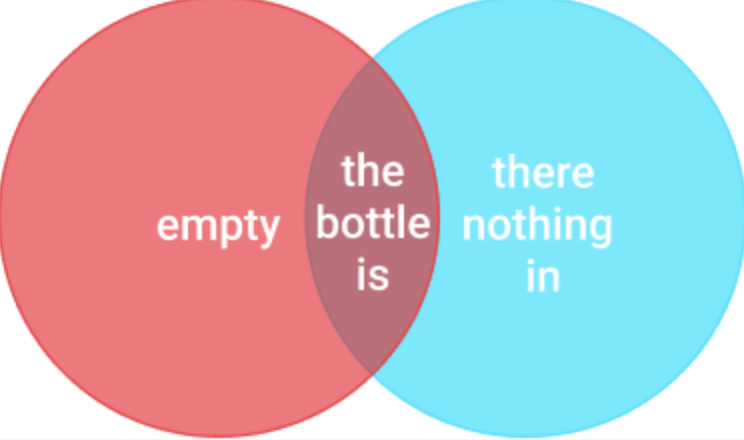

Size of the intersection of the two sets: 3

Size of the union of the two sets: 1+3+3 = 7

Using the Jaccard index, we get a similarity score of 3/7 = 0.42

In [ ]:
!pip install pandas numpy seaborn matplotlib scikit-learn spacy sentence_transformers langchain langchain_community langchain_chroma langchain_openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 3.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.2/255.2 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 607.0/607.0 kB 38.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.7/94.7 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.7/407.7 kB 30.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 23.6 MB/s eta 0:

In [ ]:
!python -m spacy download en_core_web_md

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 15.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import spacy
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt


from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer, util
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


In [ ]:
def jaccard_similarity(x: np.ndarray, y: np.ndarray) -> float:
  """ returns the jaccard similarity between two lists """

  intersection_cardinality = len(set(x) & set(y))
  union_cardinality = len(set(x) | set(y))
  return intersection_cardinality / float(union_cardinality)

In [ ]:
sentences = ["The bottle is empty",
             "There is nothing in the bottle"]
sentences = [sent.lower().split(" ") for sent in sentences]
jaccard_similarity(sentences[0], sentences[1])

0.42857142857142855

__Euclidean Distance__

Euclidean distance, or L2 norm, is the most commonly used form of the Minkowski distance. Generally speaking, when people talk about distance, they refer to Euclidean distance. It uses the Pythagoras theorem to calculate the distance between two points as indicated in the figure below:

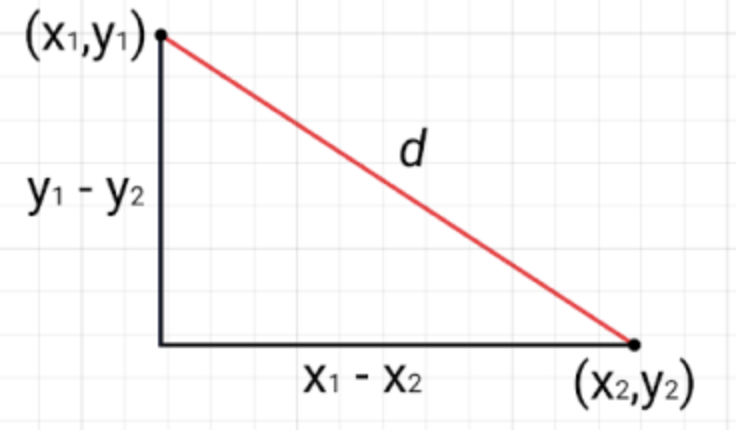

The larger the distance d between two vectors, the lower the similarity score and vice versa.

Let’s compute the similarity between our example statements using Euclidean distance:

In [ ]:
def euclidean_distance(x: np.ndarray, y: np.ndarray) -> float:
  """ return euclidean distance between two arrays """

  return float(np.sqrt(np.sum(np.power(x - y, 2))))

To compute the Euclidean distance we need vectors:

In [ ]:
vector_a, vector_b = np.random.rand(2, 256)
dist = euclidean_distance(vector_a, vector_b)
dist

6.389903442612011

Okay, so we have the Euclidean distance, but what does that mean?  
See, the problem with using distance is that it’s hard to make sense if there is nothing to compare to. The distances can vary from 0 to infinity, we need to use some way to normalize them to the range of 0 to 1.

In [ ]:
def distance_to_similarity(distance) -> float:
  return float(1 / np.exp(distance))

In [ ]:
def euclidean_similarity(vector_a, vector_b) -> float:
    distance = euclidean_distance(vector_a, vector_b)
    return distance_to_similarity(distance)

In [ ]:
euclidean_similarity(vector_a, vector_b)

0.0016784182572481482

__Cosine Similarity__

Cosine Similarity computes the similarity of two vectors as the cosine of the angle between two vectors. It determines whether two vectors are pointing in roughly the same direction. So if the angle between the vectors is 0 degrees, then the cosine similarity is 1.

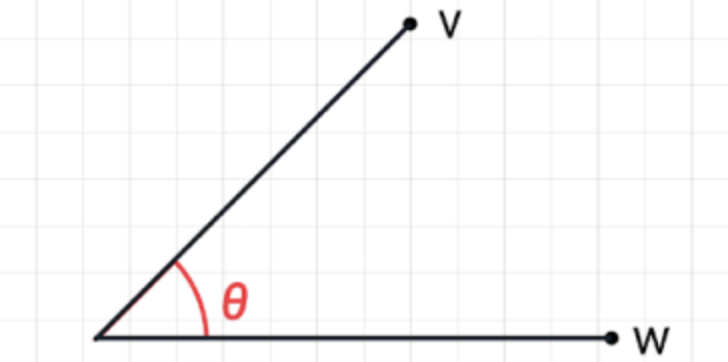

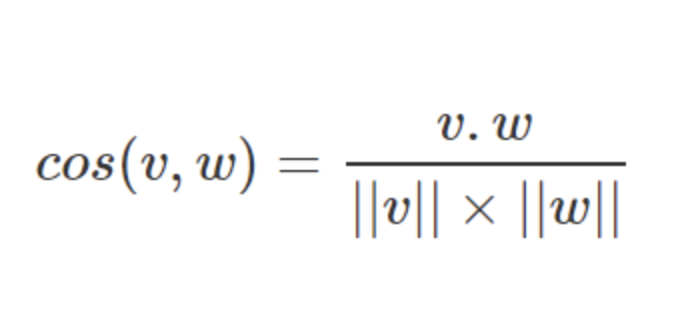

In [ ]:
def cos_similarity(x: np.ndarray, y: np.ndarray) -> float:
  """ return cosine similarity between two np.ndarrays """
  dot_product = np.dot(x, y)
  norm_x = np.linalg.norm(x)
  norm_y = np.linalg.norm(y)

  if norm_x == 0 or norm_y == 0:
    return 0  # Avoid division by zero

  cos_sim = dot_product / (norm_x * norm_y)
  return float(cos_sim)

## FAST RECAP: Text Embeddings

Humans can easily understand and derive meaning from words, but computers don’t have this natural neuro-linguistic ability.  
To make words machine-understandable we need to encode them into a numeric form, so the computer can apply mathematical formulas and operations to make sense of them. Even beyond the task of text similarity, representing documents in the form of numbers and vectors is an active area of study.


1. One-Hot Encoding & Bag-of-Words.

The most straightforward way to numerically represent words is through the one-hot encoding method.  
The idea is simple, create a vector with the size of the total number of unique words in the corpora.  
Each unique word has a unique feature and will be represented by a 1 with 0s everywhere else.  
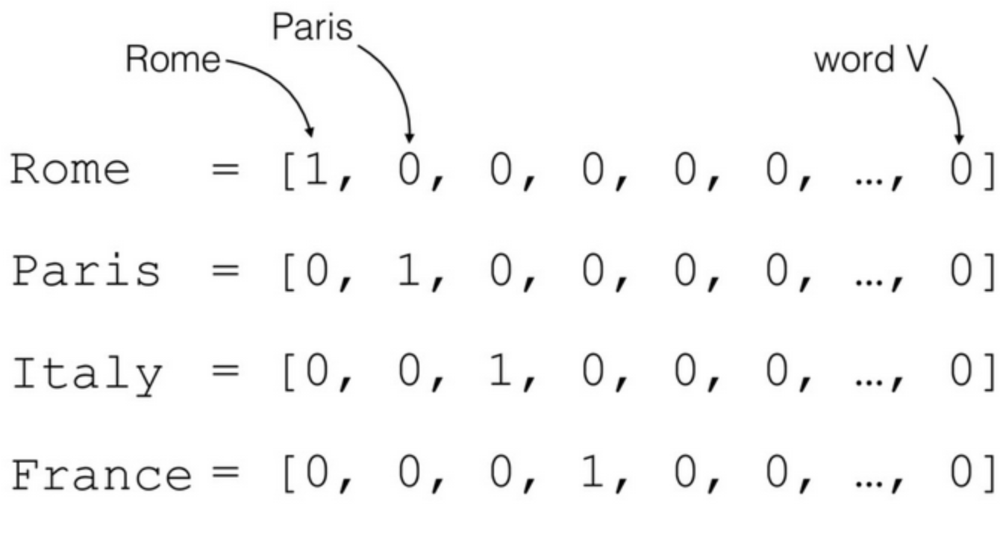

In [ ]:
def create_heatmap(similarity, labels, cmap = "YlGnBu", ) -> None:
  df = pd.DataFrame(similarity)
  df.columns = labels
  df.index = labels
  _, _ = plt.subplots(figsize=(5,5))
  sns.heatmap(df, cmap=cmap)

In [ ]:
headlines = [
#Crypto
"Инвесторов не беспокоит коррекция, поскольку криптофонды видят приток средств в размере 154 миллионов долларов",
"Цены на биткоин и Эфириум продолжают снижаться, но криптофонды наблюдают приток средств",

#Inflation
"Резкий рост инфляции в еврозоне во время пандемии: временный, но с рисками роста",
"Инфляция: почему она носит временный характер и почему повышение процентных ставок принесет больше вреда, чем пользы",

#common
"Защитит ли криптовалюта от инфляции?"]

labels = [headline[:20] for headline in headlines]

In [ ]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(headlines)
arr = X.toarray()
print(arr)

[[1 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 1 0 0
  1 0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 1 0
  0 0 0 0 0 1 1 0 0 1 0 1]
 [0 0 0 0 0 1 0 1 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0
  0 1 1 1 1 0 0 0 0 0 0 0]
 [0 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 1 1 0 2 1 0 0 1
  0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0]]


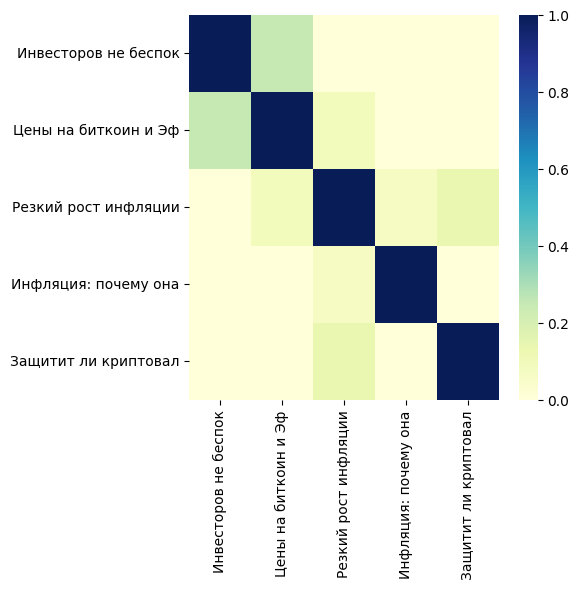

In [ ]:
create_heatmap(cosine_similarity(arr), labels=labels)

2. Term Frequency-Inverse Document Frequency (TF-IDF)

TF-IDF vectors are an extension of the one-hot encoding model.  
Instead of considering the frequency of words in one document, the frequency of words across the whole corpus is taken into account.  
The big idea is that words that occur a lot everywhere carry very little meaning or significance.  
For instance, trivial words like “and”, “or”,  “is” don’t carry as much significance as nouns and proper nouns that occur less frequently.

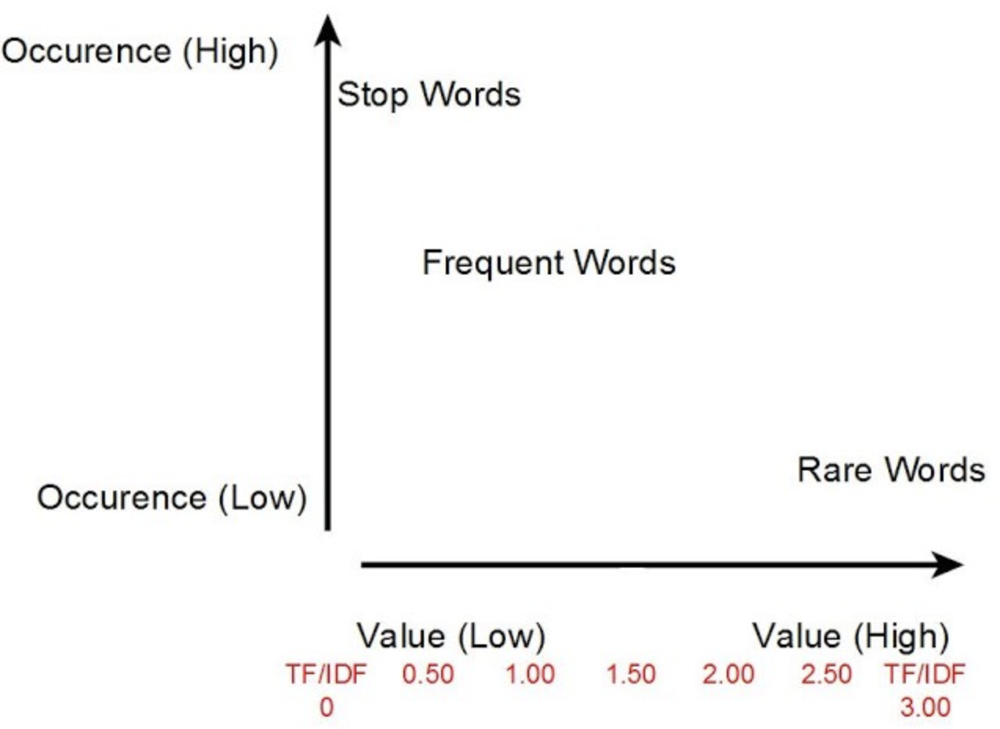

Mathematically, Term Frequency (TF) is the number of times a word appears in a document divided by the total number of words in the document. And Inverse Document Frequency (IDF) = log(N/n) where N is the total number of documents and n is the number of documents a term has appeared in. The TF-IDF value for a word is the product of the term frequency and the inverse document frequency.

Although TF-IDF vectors offer a slight improvement over simple count vectorizing, they still have very high dimensionality and don’t capture semantic relationships.

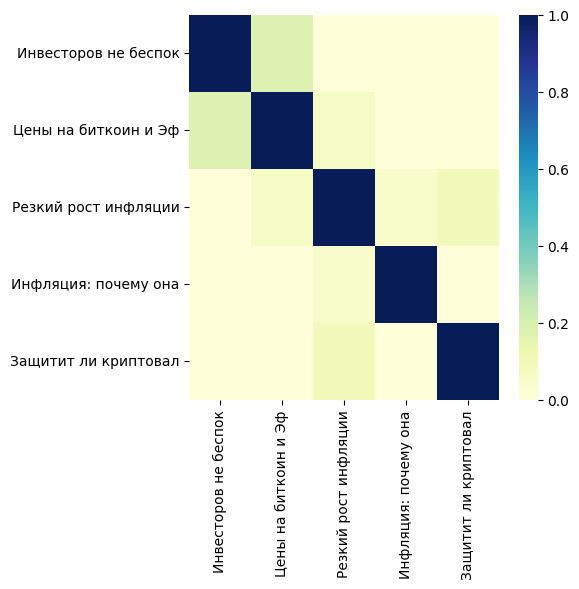

In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(headlines)
arr = X.toarray()

create_heatmap(cosine_similarity(arr), labels=labels)

3. Word2Vec

Word2Vec is a predictive method for forming word embeddings. Unlike the previous methods that need to be “trained” on the working corpus, Word2Vec is a pre-trained two-layer neural network. It takes as input the text corpus and outputs a set of feature vectors that represent words in that corpus.  It uses one of two neural network-based methods:

Continuous Bag Of Words (CBOW).  
Skip-Gram

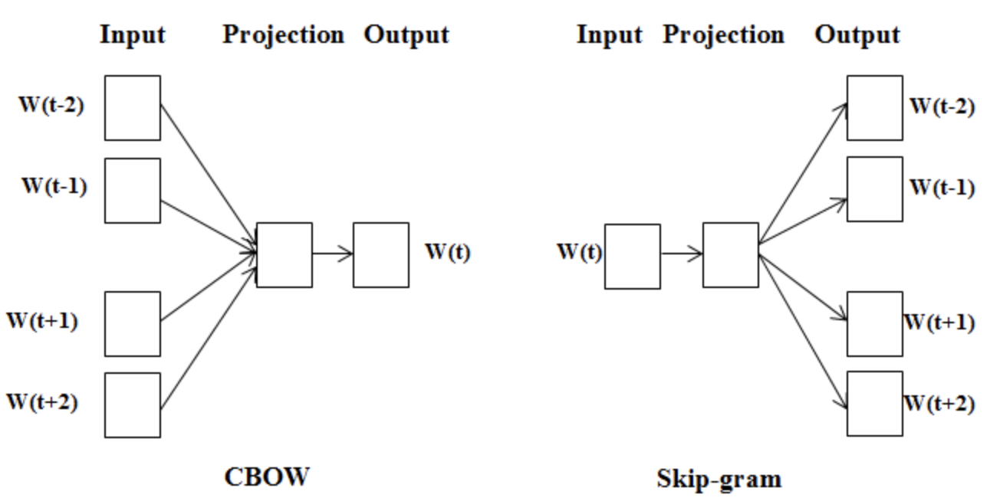


In [ ]:
nlp = spacy.load('en_core_web_md')
docs = [nlp(headline) for headline in headlines]
print(docs[0].vector[:10])

[-0.46962002 -1.063       0.48571065 -0.78498     1.0163333   0.07133867
  0.11324667  0.3193313  -0.63733864 -0.38862067]


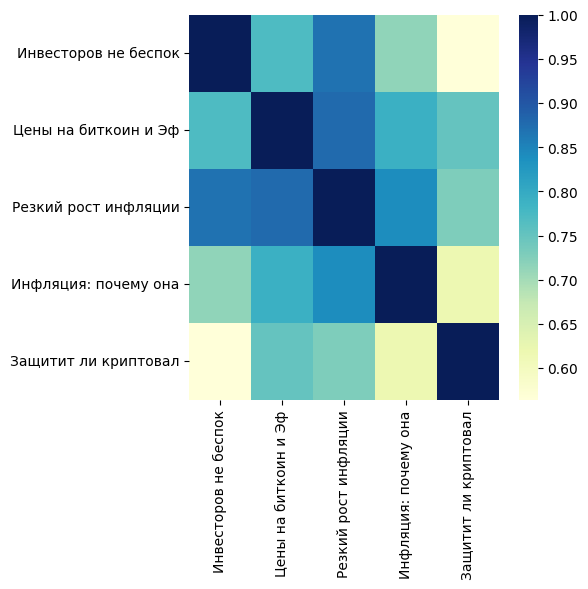

In [ ]:
similarity = np.zeros((len(docs), len(docs)))
for i in range(len(docs)):
    for j in range(len(docs)):
        docs_sim = docs[i].similarity(docs[j])
        similarity[i][j] = similarity[j][i] = docs_sim
create_heatmap(similarity, labels=labels)

## Sentence Embeddings

So far we have discussed how word embeddings represent the meaning of the words in a text document.  
But sometimes we need to go a step further and encode the meaning of the whole sentence to readily understand the context in which the words are used.  
This sentence representation is important for many downstream tasks.  
It enables us to understand the meaning of the sentence without calculating the individual embeddings of the words. It also allows us to make comparisons on the sentence level.

__Sentence Transformers__  

Much like ELMo, there are a few bidirectional LSTM based sentence encoders (InferSent, etc) but LSTMs have certain problems. Firstly, they use a hidden vector to represent the memory at the current state of the input. But for long input sequences such as sentences, a single vector isn't enough to provide all the information needed to predict the next state correctly. This bottleneck of the size of the hidden vector makes LSTM based methods more susceptible to mistakes, as in practice it can only hold information from a limited number of steps back. The Attention mechanism in transformers doesn’t have this bottleneck issue as it has access to all the previous hidden states for making predictions.

Another problem with LSTMs is the time to train. As the output is always dependent on the previous input, the training is done sequentially. This makes parallelization harder and results in longer training times. The Transformer architecture parallelized the use of the Attention mechanism in a neural network allowing for lower training time.

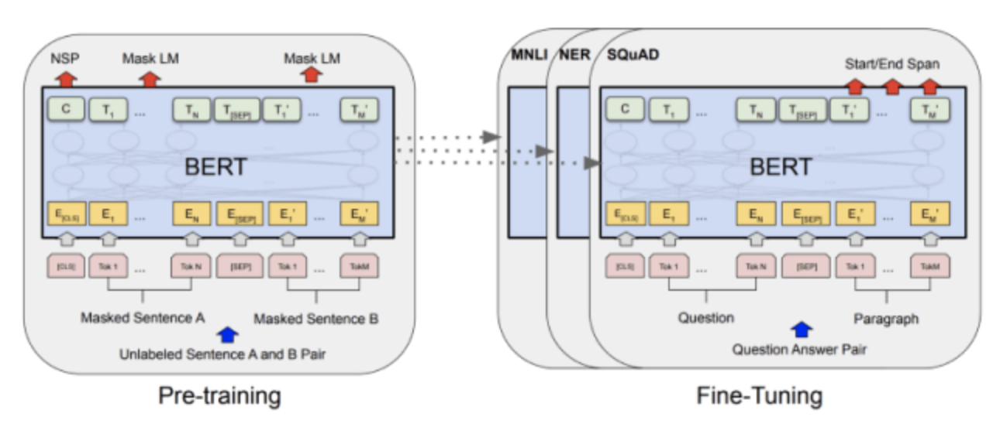

Transformer-based general language understanding models perform much better than all their predecessors. When BERT was introduced, it achieved state-of-the-art results in a wide range of tasks such as question answering or language inference with minor tweaks in its architecture.

Sentence-BERT (SBERT) is a modified BERT network that uses siamese and triplet network structures to derive semantically meaningful sentence embeddings. This reduces the effort for finding the most similar pair from 65 hours with BERT / RoBERTa to about 5 seconds with SBERT, while maintaining the accuracy from BERT.



In [ ]:
#model = SentenceTransformer('stsb-roberta-large')

In [ ]:
# embeddings = model.encode(docs, convert_to_tensor=True)
# similarity = np.zeros((len(docs), len(docs)))

# for i in range(len(embeddings)):
#     for j in range(len(embeddings)):
#       docs_sim = util.pytorch_cos_sim(embeddings[i], embeddings[j]).item()
#       similarity[i][j] = similarity[j][i] = docs_sim


# create_heatmap(similarity, labels=labels)

## Vector Search

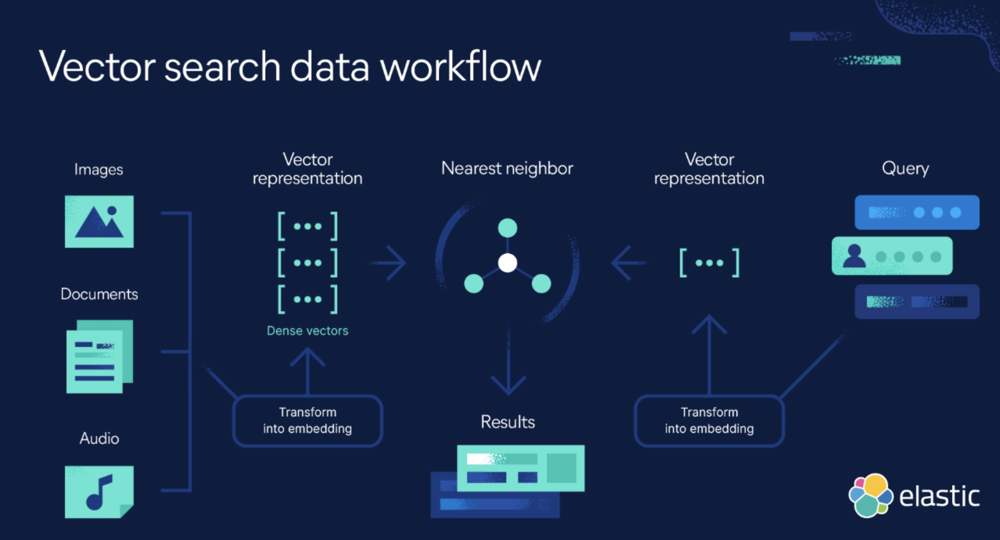

__Vector embedding__

Vector embeddings are the numeric representation of data and related context, stored in high dimensional vectors.  
Models that generate embeddings can be trained on millions of examples to deliver more relevant and accurate results.  
For some cases, numeric data that you collected or engineered to represent key features of your documents can be used as embeddings.
All you need is the ability to search efficiently.

__Similarity score__

At the core of a vector search engine is the idea that if data and documents are alike, their vectors will be similar.  
By indexing both queries and documents with vector embeddings, you find similar documents as the nearest neighbors of your query.

__ANN algorithm__  
Traditional nearest neighbor algorithms, like k-nearest neighbor algorithm (kNN), lead to excessive execution times and zaps computational resources.  
ANN sacrifices perfect accuracy in exchange for executing efficiently in high dimensional embedding spaces, at scale.

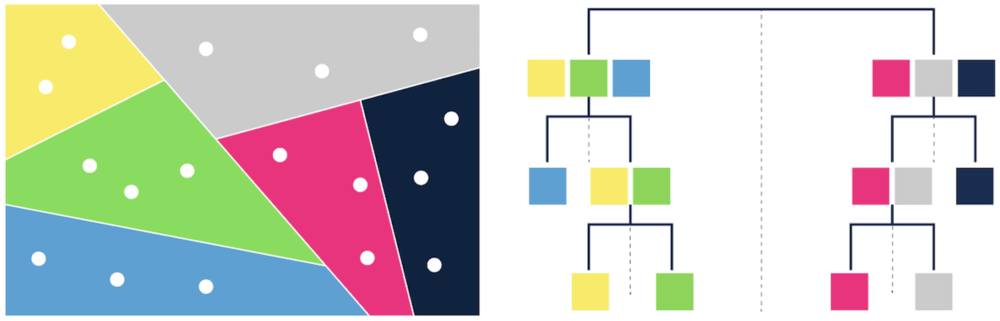

## Vector databases

Vector databases are uniquely equipped to handle high-dimensional vector data, making them ideal for a range of advanced applications, from natural language processing to image retrieval.

### Chroma

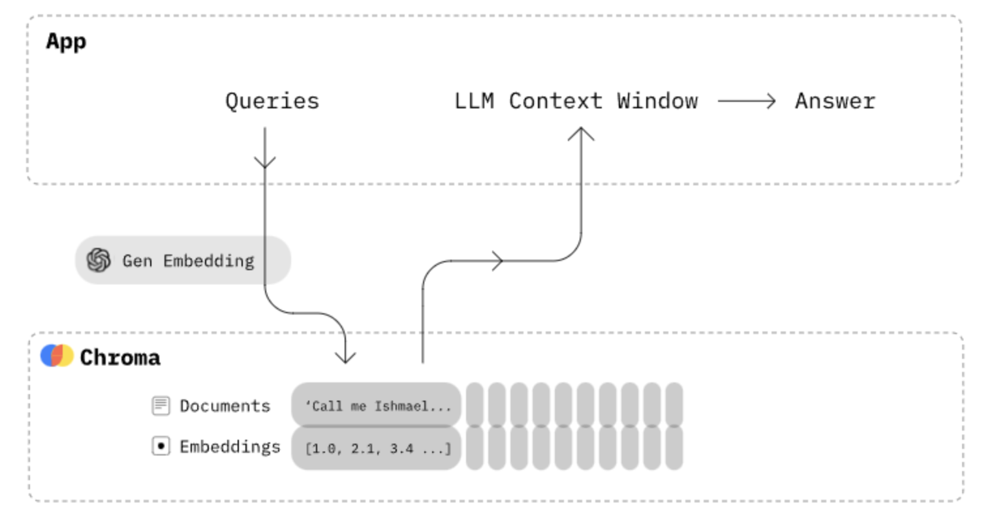

An open-source embedding database aimed at simplifying the development of Large Language Model (LLM) applications. It's particularly effective for managing text documents and transforming text into embeddings.

Key Features:

Rich features for queries, filtering, and density estimates.  
Support for LangChain in Python and JavaScript.  
Scales efficiently from Python notebooks to production clusters.  

### Weaviate

An open-source vector database that allows storage of data objects and vector embeddings from various ML models, scaling to manage billions of objects.

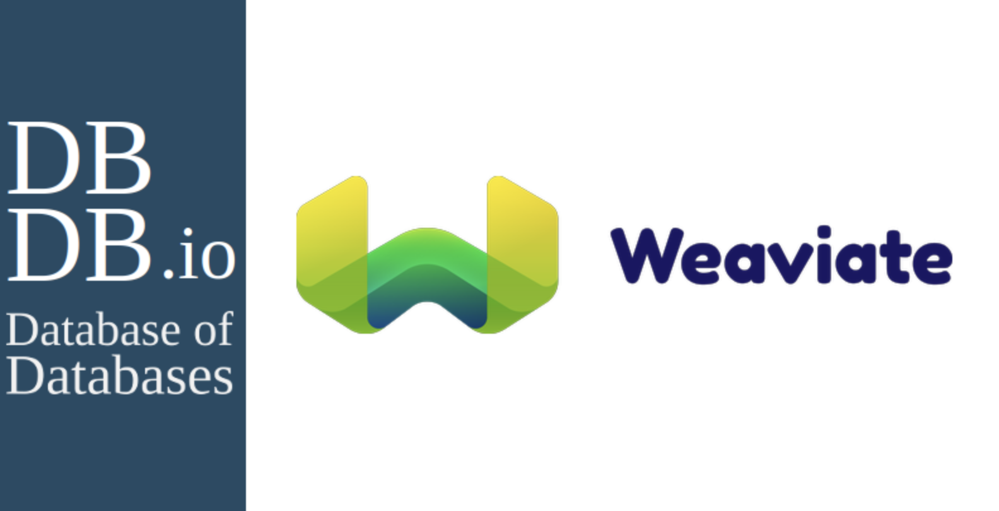


Key Features:

Quick search capabilities for large datasets.
Flexible data vectorization during import or use of own vectors.
Integrations with platforms like OpenAI, Cohere, and HuggingFace.
Focus on scalability, replication, and security for production readiness.

### Milvus

A powerful open-source vector database designed for AI applications and similarity searches, offering a consistent user experience across various deployment environments.

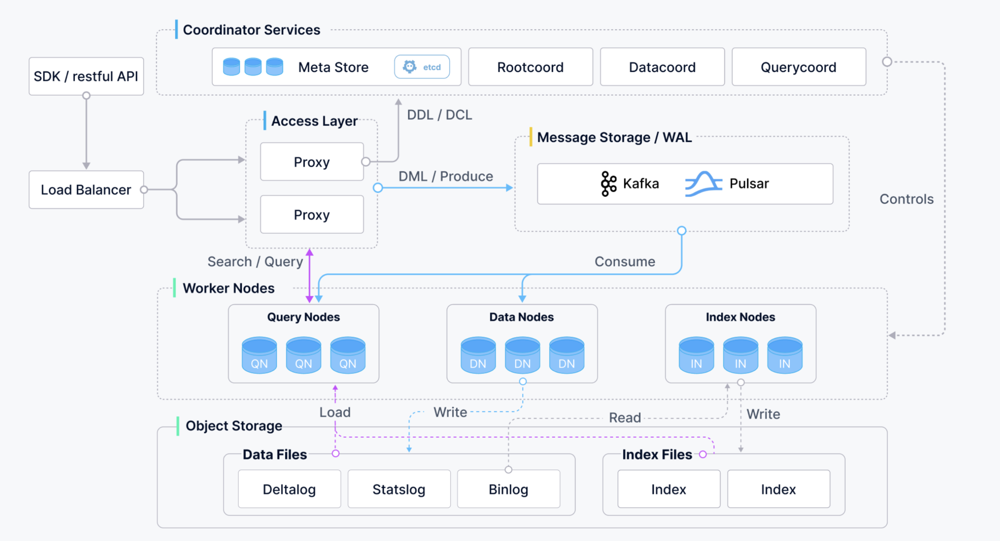

Cloud-native with separated storage and computation for enhanced elasticity.  
Millisecond search on trillion vector datasets.  
Hybrid search solution combining scalar filtering with vector similarity.  
High scalability and flexibility with component-level scaling on demand.  


#### Qdrant

An open-source vector similarity search engine and database, providing a production-ready service with a user-friendly API.

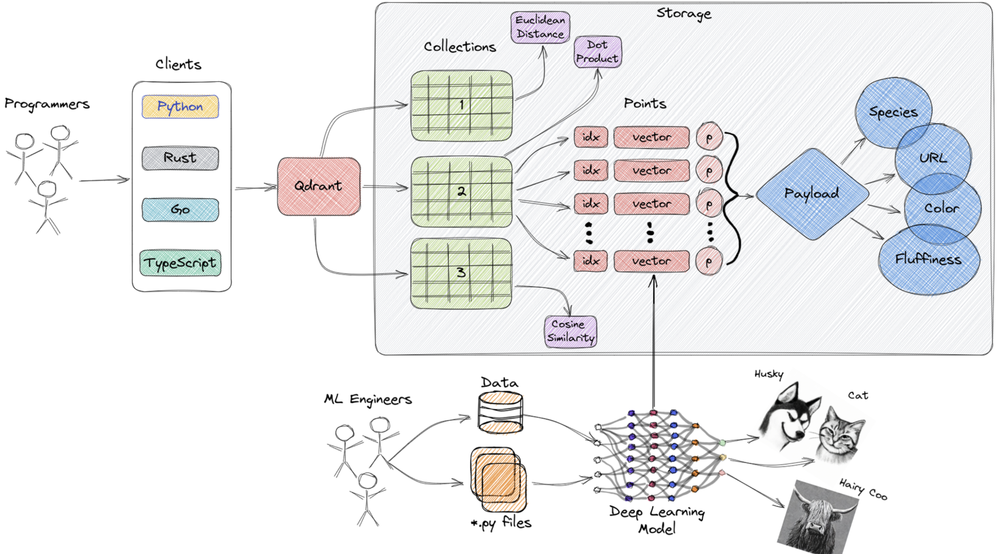


Key Features:

Payload-based storage and filtering.  
Support for various data types and query criteria.  
Efficient query execution with cached payload information.  
Robustness with write-ahead logging during power outages.  

### FAISS

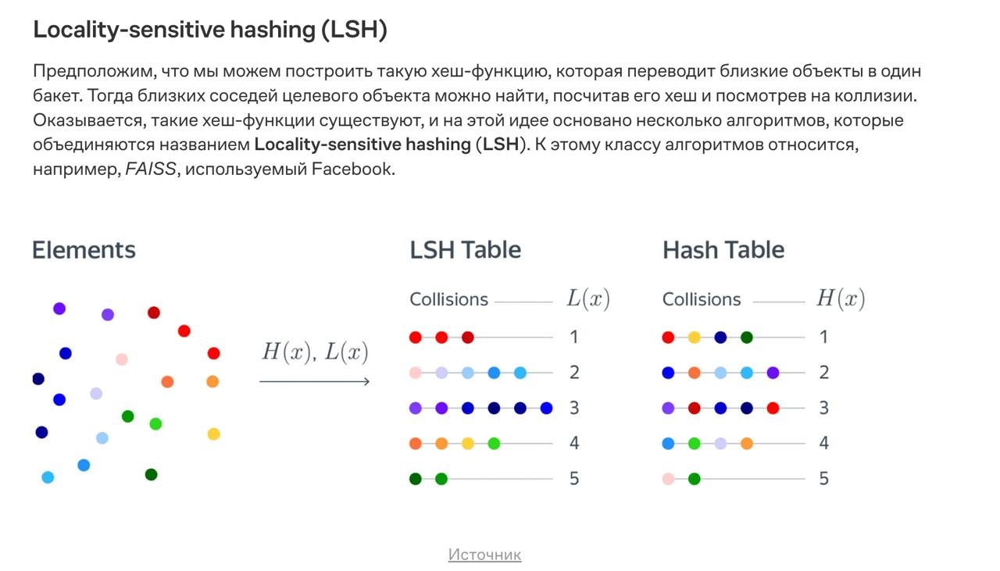

Key Features:
Efficient search across massive vector sets, even exceeding RAM capacity.
Various search methods using L2 distances, dot products, and cosine similarity.
Integrates with Python/NumPy and supports GPU execution.
Disk storage of indexes for efficient use of resources.

In [ ]:
%pip install datasets faiss-cpu

In [ ]:
from langchain.schema import Document
from datasets import load_dataset, Dataset
from langchain_community.vectorstores import FAISS
from langchain_community.vectorstores.faiss import DistanceStrategy
from langchain_community.embeddings import HuggingFaceEmbeddings

In [ ]:
import bs4
from langchain import hub
from langchain_community.document_loaders import WebBaseLoader
from langchain_chroma import Chroma
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough
from langchain_openai import OpenAIEmbeddings
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain_text_splitters import RecursiveCharacterTextSplitter

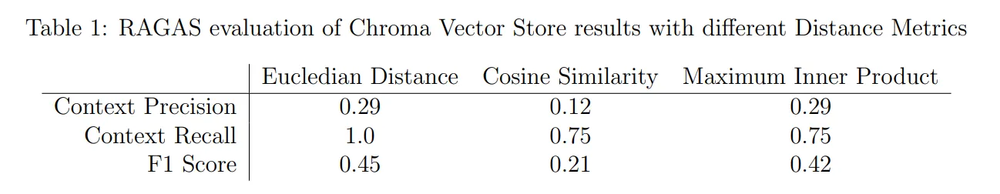

In [ ]:
EMBEDDING_MODEL_NAME = 'cointegrated/rubert-tiny2'
CHUNK_SIZE = 350
CHUNK_OVERLAP_SCALE = 0.1
TOP_K = 3

In [ ]:
splitter = RecursiveCharacterTextSplitter(
    separators=["\n\n", "\n", " "], # separates either on words or paragraphs
    chunk_size=CHUNK_SIZE,
    chunk_overlap=CHUNK_SIZE*CHUNK_OVERLAP_SCALE,
)

In [ ]:
dataset = load_dataset("stepkurniawan/sustainability-methods-wiki", "50_QA_reviewed")

In [ ]:
embedding_model = HuggingFaceEmbeddings(
    model_name=EMBEDDING_MODEL_NAME,
    multi_process=True,
    encode_kwargs={"normalize_embeddings": True}
)

In [ ]:
train_dataset = [Document(page_content=entry) for entry in dataset['train']['contexts']]
train_dataset[:1]

In [ ]:
all_splits = splitter.split_documents(train_dataset)

In [ ]:
faiss_eucledian = FAISS.from_documents(all_splits, embedding_model, distance_strategy=DistanceStrategy.EUCLIDEAN_DISTANCE)
faiss_cosine = FAISS.from_documents(all_splits, embedding_model, distance_strategy=DistanceStrategy.COSINE)
faiss_ip = FAISS.from_documents(all_splits, embedding_model, distance_strategy=DistanceStrategy.MAX_INNER_PRODUCT)

In [ ]:
for q in dataset['train']['question'][:3]:
  print(q)
  for retriever in [faiss_eucledian, faiss_cosine, faiss_ip]:
    print(retriever.distance_strategy)
    print([doc.page_content for doc in retriever.similarity_search(q, k=3)])

In [ ]:
import getpass
import os

os.environ["OPENAI_API_KEY"] = getpass.getpass()

In [ ]:
from langchain_openai import ChatOpenAI

llm = ChatOpenAI(model="gpt-3.5-turbo-0125")

In [ ]:
loader = WebBaseLoader(
    web_paths=("https://lilianweng.github.io/posts/2023-06-23-agent/",),
    bs_kwargs=dict(
        parse_only=bs4.SoupStrainer(
            class_=("post-content", "post-title", "post-header")
        )
    ),
)
docs = loader.load()

text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
splits = text_splitter.split_documents(docs)
vectorstore = Chroma.from_documents(documents=splits, embedding=OpenAIEmbeddings())

# Retrieve and generate using the relevant snippets of the blog.
retriever = vectorstore.as_retriever()
prompt = hub.pull("rlm/rag-prompt")

def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs)


rag_chain = (
    {"context": retriever | format_docs, "question": RunnablePassthrough()}
    | prompt
    | llm
    | StrOutputParser()
)

In [ ]:
rag_chain.invoke("What is Task Decomposition?")